In [100]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [101]:
df = pd.read_csv('covid_19_clean_complete.csv')
df.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
0,NaN,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean
1,NaN,Albania,41.15330,20.168300,2020-01-22,0,0,0,0,Europe
2,NaN,Algeria,28.03390,1.659600,2020-01-22,0,0,0,0,Africa
3,NaN,Andorra,42.50630,1.521800,2020-01-22,0,0,0,0,Europe
4,NaN,Angola,-11.20270,17.873900,2020-01-22,0,0,0,0,Africa


In [102]:
df.isnull().sum()

Province/State    34404
Country/Region        0
Lat                   0
Long                  0
Date                  0
Confirmed             0
Deaths                0
Recovered             0
Active                0
WHO Region            0
dtype: int64

In [103]:
df.shape

(49068, 10)

In [104]:
df.dtypes

Province/State     object
Country/Region     object
Lat               float64
Long              float64
Date               object
Confirmed           int64
Deaths              int64
Recovered           int64
Active              int64
WHO Region         object
dtype: object

In [105]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Province/State  14664 non-null  object 
 1   Country/Region  49068 non-null  object 
 2   Lat             49068 non-null  float64
 3   Long            49068 non-null  float64
 4   Date            49068 non-null  object 
 5   Confirmed       49068 non-null  int64  
 6   Deaths          49068 non-null  int64  
 7   Recovered       49068 non-null  int64  
 8   Active          49068 non-null  int64  
 9   WHO Region      49068 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 3.7+ MB


In [106]:
df.describe()

,Lat,Long,Confirmed,Deaths,Recovered,Active
count,49068.000000,49068.000000,4.906800e+04,49068.000000,4.906800e+04,4.906800e+04
mean,21.433730,23.528236,1.688490e+04,884.179160,7.915713e+03,8.085012e+03
std,24.950320,70.442740,1.273002e+05,6313.584411,5.480092e+04,7.625890e+04
min,-51.796300,-135.000000,0.000000e+00,0.000000,0.000000e+00,-1.400000e+01
25%,7.873054,-15.310100,4.000000e+00,0.000000,0.000000e+00,0.000000e+00
50%,23.634500,21.745300,1.680000e+02,2.000000,2.900000e+01,2.600000e+01
75%,41.204380,80.771797,1.518250e+03,30.000000,6.660000e+02,6.060000e+02
max,71.706900,178.065000,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06


In [107]:
df['Province/State'].unique()

array([nan, 'Australian Capital Territory', 'New South Wales',
       'Northern Territory', 'Queensland', 'South Australia', 'Tasmania',
       'Victoria', 'Western Australia', 'Alberta', 'British Columbia',
       'Manitoba', 'New Brunswick', 'Newfoundland and Labrador',
       'Nova Scotia', 'Ontario', 'Prince Edward Island', 'Quebec',
       'Saskatchewan', 'Anhui', 'Beijing', 'Chongqing', 'Fujian', 'Gansu',
       'Guangdong', 'Guangxi', 'Guizhou', 'Hainan', 'Hebei',
       'Heilongjiang', 'Henan', 'Hong Kong', 'Hubei', 'Hunan',
       'Inner Mongolia', 'Jiangsu', 'Jiangxi', 'Jilin', 'Liaoning',
       'Macau', 'Ningxia', 'Qinghai', 'Shaanxi', 'Shandong', 'Shanghai',
       'Shanxi', 'Sichuan', 'Tianjin', 'Tibet', 'Xinjiang', 'Yunnan',
       'Zhejiang', 'Faroe Islands', 'Greenland', 'French Guiana',
       'French Polynesia', 'Guadeloupe', 'Mayotte', 'New Caledonia',
       'Reunion', 'Saint Barthelemy', 'St Martin', 'Martinique', 'Aruba',
       'Curacao', 'Sint Maarten', 'Bermud

In [108]:
df['Date'] = pd.to_datetime(df['Date'])
df['Date'].dtypes

dtype('<M8[ns]')

In [109]:
# 1. Sort the DataFrame by Date and Country/Region
df.sort_values(by=['Date', 'Country/Region'], inplace=True)

# 2. Group by 'Date' and 'Country/Region', aggregating the numerical columns
agg_df = df.groupby(['Date', 'Country/Region'], as_index=False).agg({
    'Lat': 'mean',           # Average latitude
    'Long': 'mean',          # Average longitude
    'Confirmed': 'sum',      # Sum of confirmed cases
    'Deaths': 'sum',         # Sum of deaths
    'Recovered': 'sum',      # Sum of recovered cases
    'Active': 'sum'          # Sum of active cases
})

# Display the first few rows
agg_df.head()

,Date,Country/Region,Lat,Long,Confirmed,Deaths,Recovered,Active
0,2020-01-22,Afghanistan,33.93911,67.709953,0,0,0,0
1,2020-01-22,Albania,41.15330,20.168300,0,0,0,0
2,2020-01-22,Algeria,28.03390,1.659600,0,0,0,0
3,2020-01-22,Andorra,42.50630,1.521800,0,0,0,0
4,2020-01-22,Angola,-11.20270,17.873900,0,0,0,0


In [110]:
#agg_df.to_csv('aggregated covid19 data.csv')

In [111]:
agg_df.isnull().sum()

Date              0
Country/Region    0
Lat               0
Long              0
Confirmed         0
Deaths            0
Recovered         0
Active            0
dtype: int64

In [112]:
agg_df.describe()

,Date,Lat,Long,Confirmed,Deaths,Recovered,Active
count,35156,35156.000000,35156.000000,3.515600e+04,35156.000000,3.515600e+04,3.515600e+04
mean,2020-04-24 12:00:00,19.905894,16.743931,2.356663e+04,1234.068239,1.104813e+04,1.128443e+04
min,2020-01-22 00:00:00,-40.900600,-102.552800,0.000000e+00,0.000000,0.000000e+00,-2.000000e+00
25%,2020-03-08 18:00:00,5.152149,-9.696600,1.000000e+00,0.000000,0.000000e+00,0.000000e+00
50%,2020-04-24 12:00:00,18.735700,19.503300,2.500000e+02,4.000000,3.300000e+01,8.500000e+01
75%,2020-06-10 06:00:00,40.143100,45.038200,3.640250e+03,78.250000,1.286250e+03,1.454000e+03
max,2020-07-27 00:00:00,71.706900,178.065000,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06
std,NaN,23.685510,57.651454,1.499818e+05,7437.238354,6.454640e+04,8.997149e+04


In [113]:
# Check for negative values in the Active column
negative_active_cases = agg_df[agg_df['Active'] < 0]

# Display the rows with negative Active cases, if any
print(f"Number of rows with negative 'Active' cases: {negative_active_cases.shape[0]}")
negative_active_cases.head()

Number of rows with negative 'Active' cases: 2


,Date,Country/Region,Lat,Long,Confirmed,Deaths,Recovered,Active
28711,2020-06-23,Liechtenstein,47.140000,9.550000,82,2,81,-1
33834,2020-07-20,Uganda,1.373333,32.290275,1069,0,1071,-2


In [114]:
agg_df['Active'] = agg_df['Active'].clip(lower=0)
agg_df.describe()

,Date,Lat,Long,Confirmed,Deaths,Recovered,Active
count,35156,35156.000000,35156.000000,3.515600e+04,35156.000000,3.515600e+04,3.515600e+04
mean,2020-04-24 12:00:00,19.905894,16.743931,2.356663e+04,1234.068239,1.104813e+04,1.128443e+04
min,2020-01-22 00:00:00,-40.900600,-102.552800,0.000000e+00,0.000000,0.000000e+00,0.000000e+00
25%,2020-03-08 18:00:00,5.152149,-9.696600,1.000000e+00,0.000000,0.000000e+00,0.000000e+00
50%,2020-04-24 12:00:00,18.735700,19.503300,2.500000e+02,4.000000,3.300000e+01,8.500000e+01
75%,2020-06-10 06:00:00,40.143100,45.038200,3.640250e+03,78.250000,1.286250e+03,1.454000e+03
max,2020-07-27 00:00:00,71.706900,178.065000,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06
std,NaN,23.685510,57.651454,1.499818e+05,7437.238354,6.454640e+04,8.997149e+04


In [115]:
#set date as index for easier operations 
agg_df.set_index('Date', inplace=True)
agg_df.head()

,Country/Region,Lat,Long,Confirmed,Deaths,Recovered,Active
Date,,,,,,,
2020-01-22,Afghanistan,33.93911,67.709953,0,0,0,0
2020-01-22,Albania,41.15330,20.168300,0,0,0,0
2020-01-22,Algeria,28.03390,1.659600,0,0,0,0
2020-01-22,Andorra,42.50630,1.521800,0,0,0,0
2020-01-22,Angola,-11.20270,17.873900,0,0,0,0


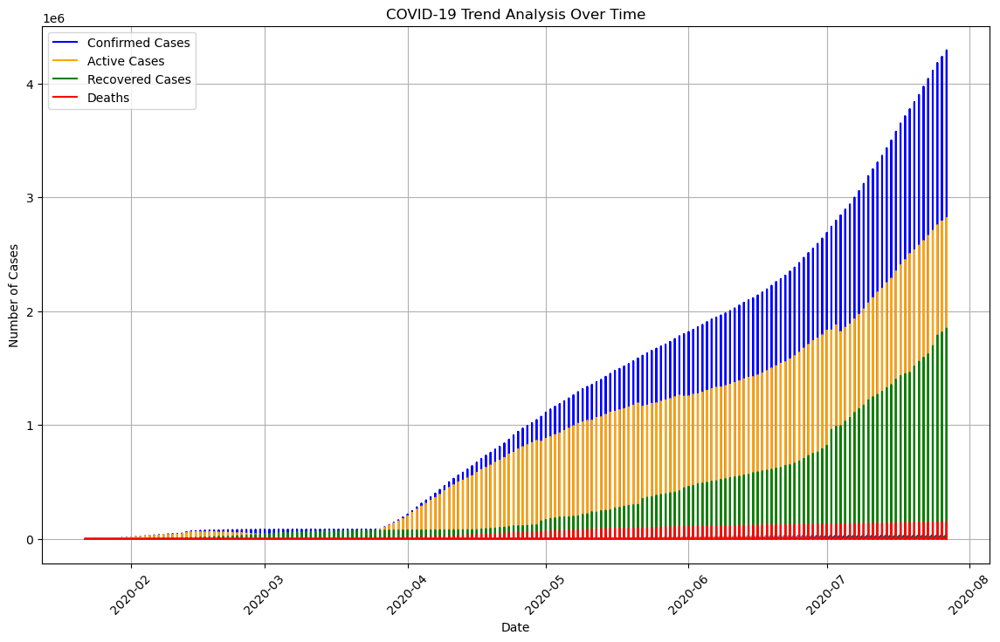

In [116]:
# Plotting the trends
plt.figure(figsize=(14, 8))

# Plot confirmed cases
plt.plot(agg_df.index, agg_df['Confirmed'], label='Confirmed Cases', color='blue')

# Plot active cases
plt.plot(agg_df.index, agg_df['Active'], label='Active Cases', color='orange')

# Plot recovered cases
plt.plot(agg_df.index, agg_df['Recovered'], label='Recovered Cases', color='green')

# Plot death cases
plt.plot(agg_df.index, agg_df['Deaths'], label='Deaths', color='red')

# Adding labels and title
plt.xlabel('Date')
plt.ylabel('Number of Cases')
plt.title('COVID-19 Trend Analysis Over Time')
plt.legend()
plt.grid()
plt.xticks(rotation=45)

# Display the plot
plt.show()

In [117]:
# Replace 'Taiwan*' with 'Taiwan' in the 'Country/Region' column
agg_df['Country/Region'] = agg_df['Country/Region'].replace('Taiwan*', 'Taiwan')

# Verify the change
agg_df['Country/Region'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Brunei', 'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi',
       'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon',
       'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Greenland',
       'Grenada', 'Guatemala', 'Guinea', 'G

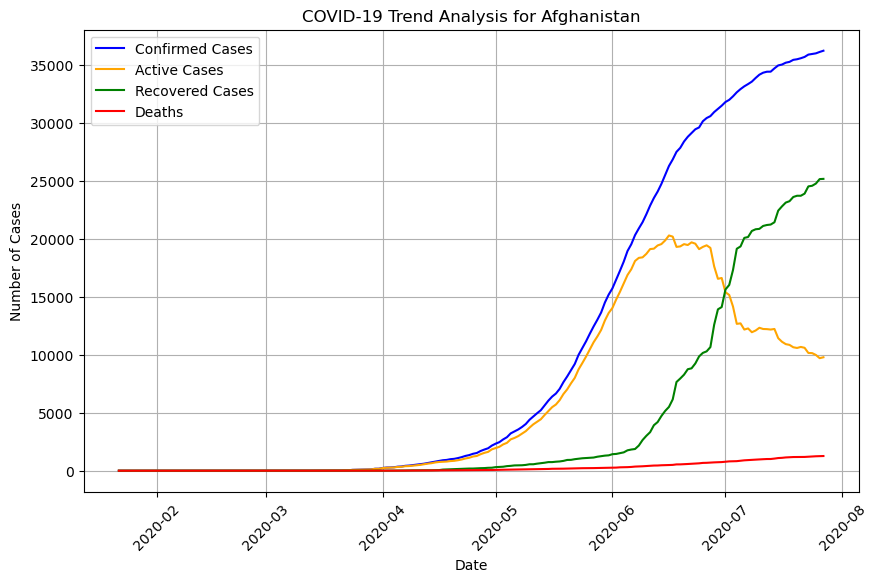

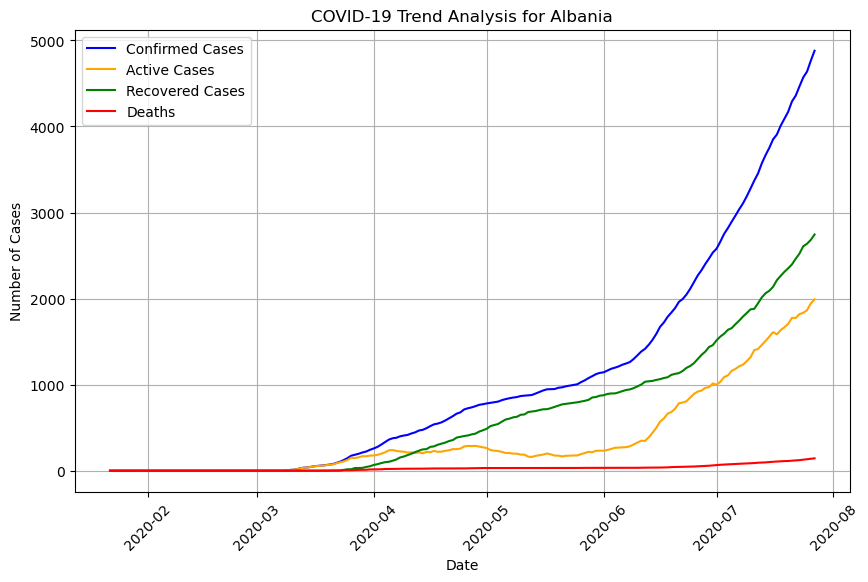

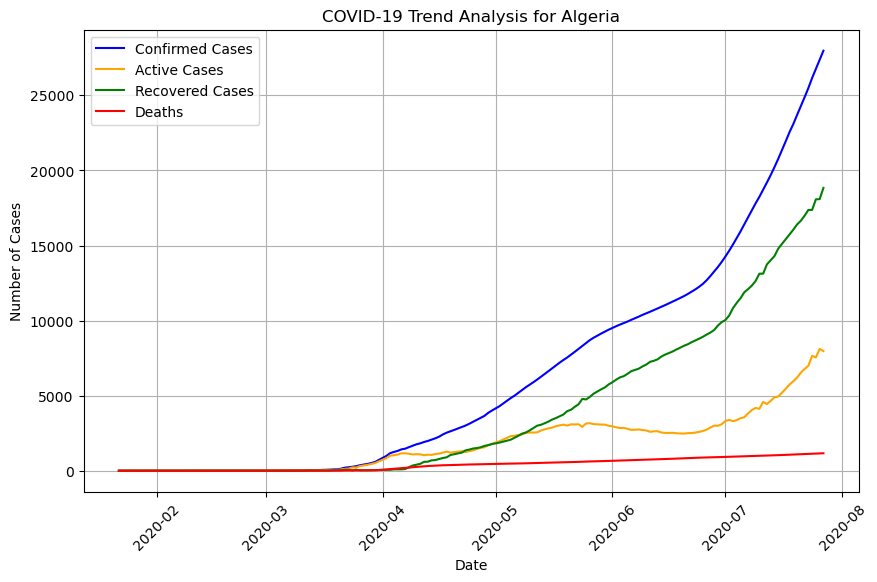

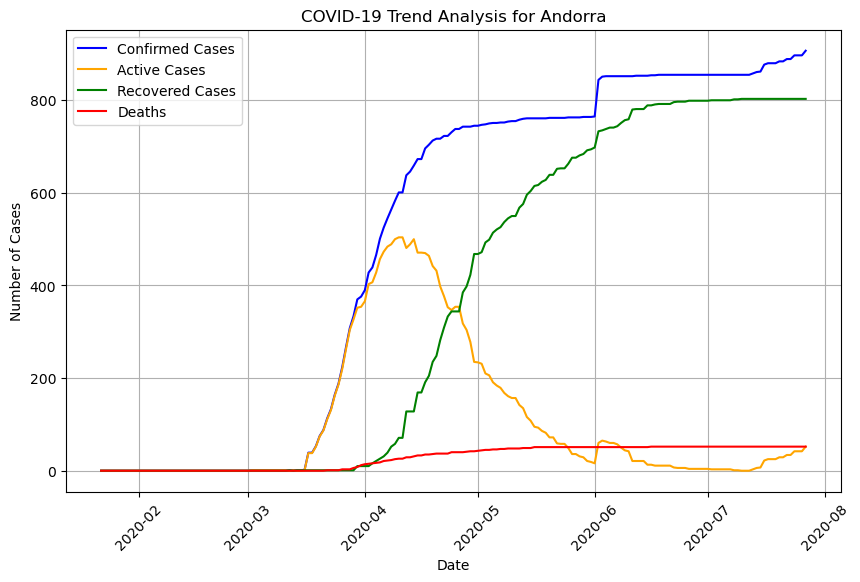

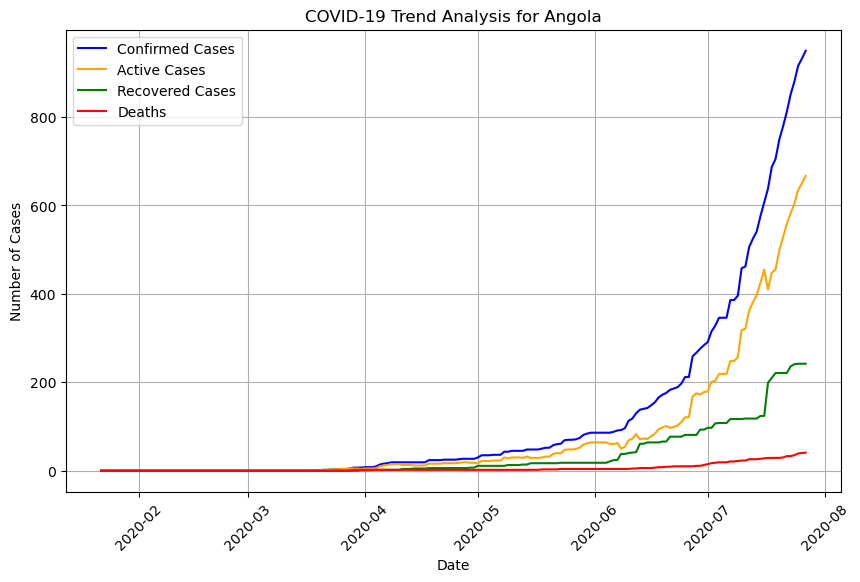

...

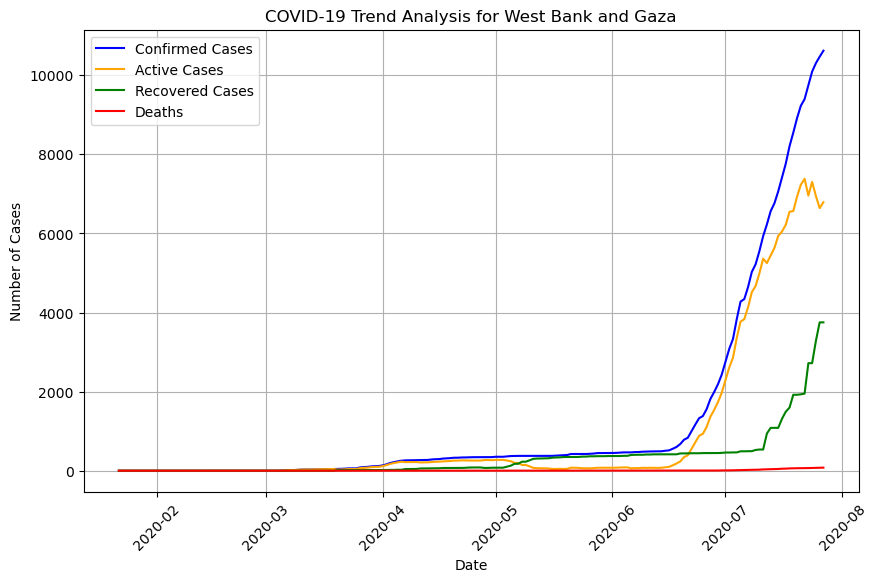

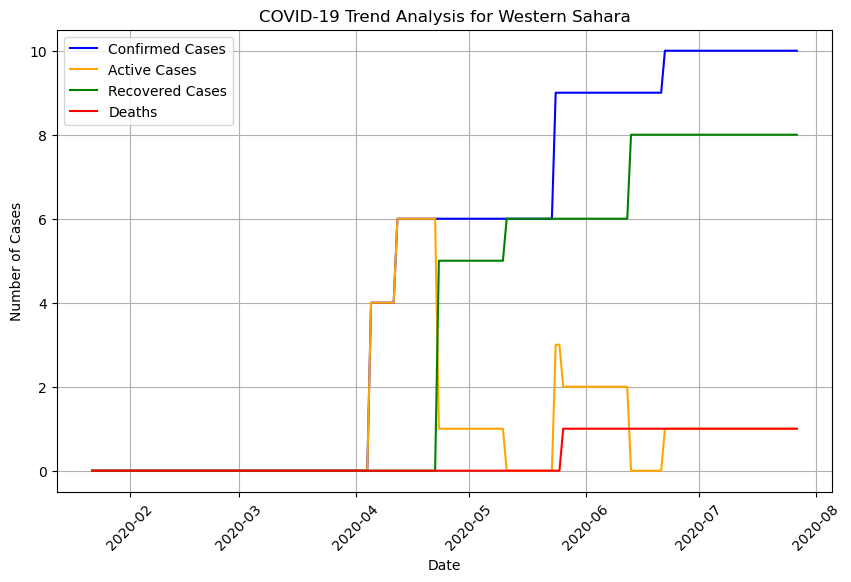

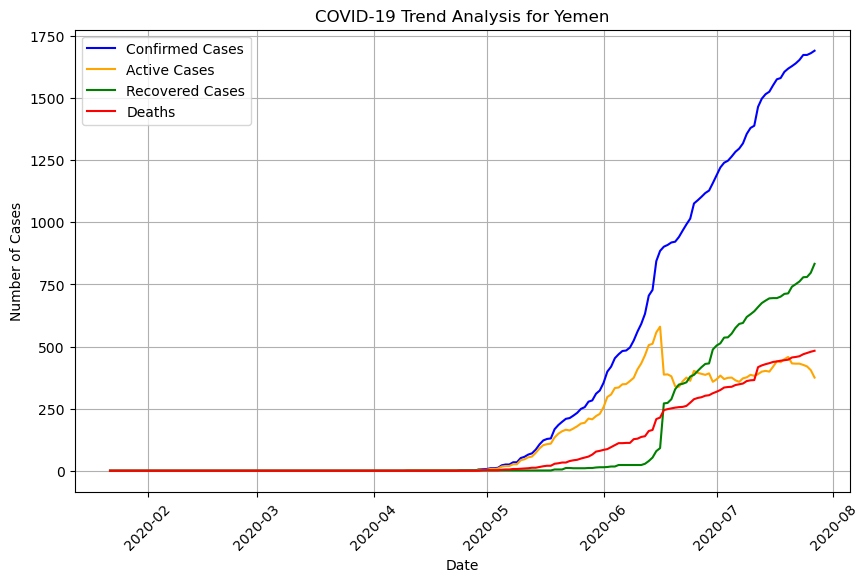

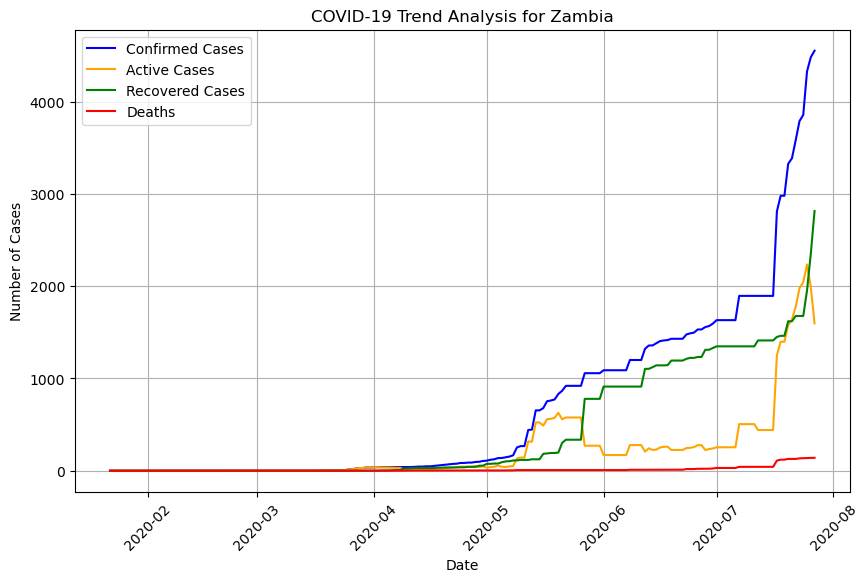

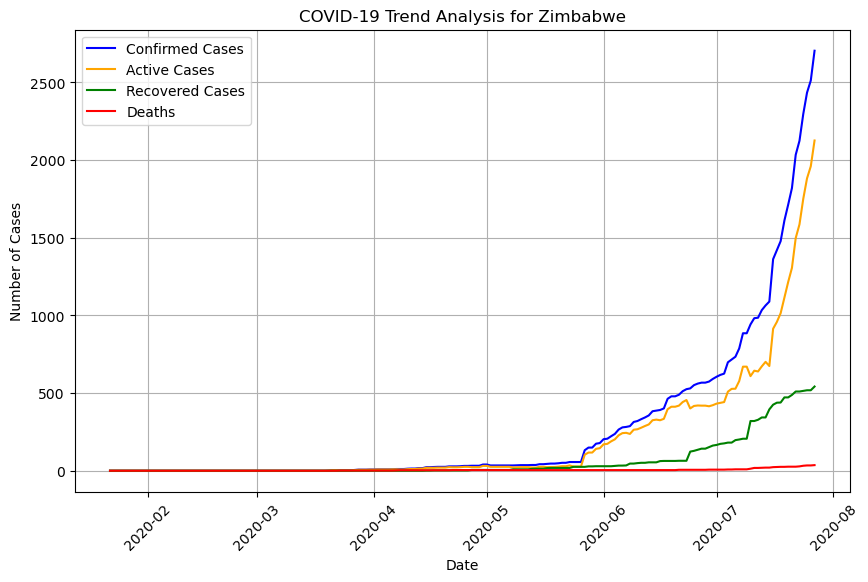

Plots have been saved in the 'country_plots' directory.


In [125]:
# Group data by 'Country/Region' and 'Date', summing up numerical columns
country_data = agg_df.groupby(['Country/Region', 'Date'])[['Confirmed', 'Active', 'Recovered', 'Deaths']].sum().reset_index()

# Get the list of unique countries/regions
countries = country_data['Country/Region'].unique()

# Directory to save plots (optional)
import os
output_dir = "country_plots"
os.makedirs(output_dir, exist_ok=True)

# Iterate through each country/region and create plots
for country in countries:
    # Filter data for the current country
    country_df = country_data[country_data['Country/Region'] == country]

    # Plot the trends
    plt.figure(figsize=(10, 6))
    plt.plot(country_df['Date'], country_df['Confirmed'], label='Confirmed Cases', color='blue')
    plt.plot(country_df['Date'], country_df['Active'], label='Active Cases', color='orange')
    plt.plot(country_df['Date'], country_df['Recovered'], label='Recovered Cases', color='green')
    plt.plot(country_df['Date'], country_df['Deaths'], label='Deaths', color='red')

    # Plot formatting
    plt.title(f"COVID-19 Trend Analysis for {country}")
    plt.xlabel("Date")
    plt.ylabel("Number of Cases")
    plt.legend()
    plt.xticks(rotation=45)
    plt.grid()

    #show the plot
    plt.show()
    # Save the plot (optional)
    plt.savefig(f"{output_dir}/{country}_trend.png")
    plt.close()

print(f"Plots have been saved in the '{output_dir}' directory.")

In [119]:
agg_df['Country/Region'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Brunei', 'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi',
       'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon',
       'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Greenland',
       'Grenada', 'Guatemala', 'Guinea', 'G

In [123]:
countries = country_data['Country/Region'].unique()

In [129]:
# Calculate the correlation matrix for numerical columns
correlation_matrix = agg_df[['Confirmed', 'Active', 'Recovered', 'Deaths']].corr()
correlation_matrix

,Confirmed,Active,Recovered,Deaths
Confirmed,1.000000,0.949940,0.894418,0.912016
Active,0.949940,1.000000,0.710665,0.891647
Recovered,0.894418,0.710665,1.000000,0.761093
Deaths,0.912016,0.891647,0.761093,1.000000


In [131]:
import seaborn as sns

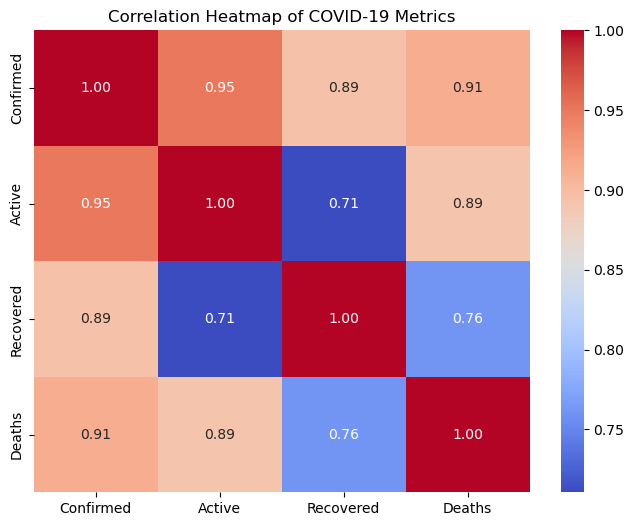

In [133]:
# Plot a heatmap of the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', cbar=True)
plt.title("Correlation Heatmap of COVID-19 Metrics")
plt.show()

In [141]:
# Grouping the data by 'Country/Region'
country_groups = agg_df.groupby('Country/Region')

# Creating a dictionary to store the correlation matrices for each country
country_correlation_matrices = {}

for country, group in country_groups:
    # Computing the correlation matrix for the country
    correlation_matrix = group[['Confirmed', 'Active', 'Recovered', 'Deaths']].corr()
    country_correlation_matrices[country] = correlation_matrix
    
     # Converting to a DataFrame for display
    correlation_df = pd.DataFrame(correlation_matrix)
    print(f"Correlation matrix for {country}:\n{correlation_df}\n")

# To store results in files for further analysis:
output_dir = 'country_correlation_matrices'
os.makedirs(output_dir, exist_ok=True)
for country, matrix in country_correlation_matrices.items():
    filename = os.path.join(output_dir, f"{country}_correlation.csv")
    matrix.to_csv('correlation by country.csv')

print("Country-wise correlation matrices saved successfully.")

Correlation matrix for Afghanistan:
           Confirmed    Active  Recovered    Deaths
Confirmed   1.000000  0.870931   0.899373  0.965385
Active      0.870931  1.000000   0.568468  0.719820
Recovered   0.899373  0.568468   1.000000  0.975490
Deaths      0.965385  0.719820   0.975490  1.000000

Correlation matrix for Albania:
           Confirmed    Active  Recovered    Deaths
Confirmed   1.000000  0.983380   0.991863  0.986957
Active      0.983380  1.000000   0.952301  0.970387
Recovered   0.991863  0.952301   1.000000  0.977859
Deaths      0.986957  0.970387   0.977859  1.000000

Correlation matrix for Algeria:
           Confirmed    Active  Recovered    Deaths
Confirmed   1.000000  0.966350   0.994979  0.951487
Active      0.966350  1.000000   0.936415  0.935219
Recovered   0.994979  0.936415   1.000000  0.933946
Deaths      0.951487  0.935219   0.933946  1.000000

Correlation matrix for Andorra:
           Confirmed    Active  Recovered    Deaths
Confirmed   1.000000  0.206487   

In [139]:
correlation_df

,Confirmed,Active,Recovered,Deaths
Confirmed,1.000000,0.996997,0.975648,0.965578
Active,0.996997,1.000000,0.955759,0.952484
Recovered,0.975648,0.955759,1.000000,0.968161
Deaths,0.965578,0.952484,0.968161,1.000000


In [143]:
from statsmodels.tsa.stattools import adfuller

#Augmented Dickey-Fuller (ADF) test. 
#The test checks the null hypothesis that a unit root is present (i.e., the series is non-stationary). 
#If the p-value is less than a significance level (e.g., 0.05), we reject the null hypothesis, indicating stationarity.

# Function to perform ADF test
def check_stationarity(series):
    result = adfuller(series)
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    print("Critical Values:")
    for key, value in result[4].items():
        print(f"   {key}: {value}")
    if result[1] < 0.05:
        print("The series is stationary.")
    else:
        print("The series is non-stationary.")

# Example usage for each variable
variables = ['Confirmed', 'Active', 'Recovered', 'Deaths']
for var in variables:
    print(f"\nStationarity Check for {var}:")
    check_stationarity(agg_df[var])


Stationarity Check for Confirmed:
ADF Statistic: -12.5774092245716
p-value: 1.943692446942312e-23
Critical Values:
   1%: -3.430536291930778
   5%: -2.861622336437604
   10%: -2.566813825096627
The series is stationary.

Stationarity Check for Active:
ADF Statistic: -17.792113870309258
p-value: 3.2440107564494724e-30
Critical Values:
   1%: -3.4305363025455717
   5%: -2.861622341128934
   10%: -2.5668138275937
The series is stationary.

Stationarity Check for Recovered:
ADF Statistic: -10.365240016772647
p-value: 2.339625146584055e-18
Critical Values:
   1%: -3.4305363025455717
   5%: -2.861622341128934
   10%: -2.5668138275937
The series is stationary.

Stationarity Check for Deaths:
ADF Statistic: -16.6715895422123
p-value: 1.5432677717832978e-29
Critical Values:
   1%: -3.4305363025455717
   5%: -2.861622341128934
   10%: -2.5668138275937
The series is stationary.


In [145]:
agg_df

,Country/Region,Lat,Long,Confirmed,Deaths,Recovered,Active
Date,,,,,,,
2020-01-22,Afghanistan,33.939110,67.709953,0,0,0,0
2020-01-22,Albania,41.153300,20.168300,0,0,0,0
2020-01-22,Algeria,28.033900,1.659600,0,0,0,0
2020-01-22,Andorra,42.506300,1.521800,0,0,0,0
2020-01-22,Angola,-11.202700,17.873900,0,0,0,0
...,...,...,...,...,...,...,...
2020-07-27,West Bank and Gaza,31.952200,35.233200,10621,78,3752,6791
2020-07-27,Western Sahara,24.215500,-12.885800,10,1,8,1
2020-07-27,Yemen,15.552727,48.516388,1691,483,833,375


In [149]:
data = agg_df.drop(columns=['Country/Region', 'Lat', 'Long'])
data

,Confirmed,Deaths,Recovered,Active
Date,,,,
2020-01-22,0,0,0,0
2020-01-22,0,0,0,0
2020-01-22,0,0,0,0
2020-01-22,0,0,0,0
2020-01-22,0,0,0,0
...,...,...,...,...
2020-07-27,10621,78,3752,6791
2020-07-27,10,1,8,1
2020-07-27,1691,483,833,375


In [181]:
data.index = pd.to_datetime(data.index)
data.index.freq = pd.infer_freq(data.index)

In [193]:
data.index = pd.to_datetime(data.index)
data.index.freq = 'd'

ValueError: Inferred frequency None from passed values does not conform to passed frequency D

In [185]:
data

,Confirmed,Deaths,Recovered,Active
Date,,,,
2020-01-22,0,0,0,0
2020-01-22,0,0,0,0
2020-01-22,0,0,0,0
2020-01-22,0,0,0,0
2020-01-22,0,0,0,0
...,...,...,...,...
2020-07-27,10621,78,3752,6791
2020-07-27,10,1,8,1
2020-07-27,1691,483,833,375


In [177]:
from statsmodels.tsa.api import VAR

# Create a VAR model object using your stationary time series data
model = VAR(data)

# Perform lag order selection using AIC and BIC criteria
lag_selection = model.select_order(maxlags=15)  # Adjust maxlags based on your data size

# Display the results
print("Selected Lag Order by AIC:", lag_selection.aic)
print("Selected Lag Order by BIC:", lag_selection.bic)
print("Full Summary:\n", lag_selection.summary())

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Selected Lag Order by AIC: 13
Selected Lag Order by BIC: 13
Full Summary:
  VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        51.45       51.46   2.219e+22       51.45
1        51.60       51.61   2.573e+22       51.60
2        51.42       51.43   2.138e+22       51.42
3        51.45       51.46   2.213e+22       51.46
4        51.17       51.19   1.674e+22       51.18
5        51.21       51.23   1.747e+22       51.22
6        51.21       51.23   1.733e+22       51.21
7        51.22       51.25   1.759e+22       51.23
8        51.13       51.16   1.600e+22       51.14
9        51.12       51.16   1.589e+22       51.13
10       51.11       51.15   1.570e+22       51.12
11       51.12       51.17   1.593e+22       51.14
12       51.15       51.19   1.634e+22       51.16
13      51.06*      51.11*  1.502e+22*      51.08*
14       51.09       51.15   1.547e+22       51.11
15     

In [153]:
# Define the split point (e.g., 80% training, 20% testing)
split_point = int(len(data) * 0.8)

# Split the data
train_data = data.iloc[:split_point]
test_data = data.iloc[split_point:]

In [155]:
var_model = VAR(train_data)
var_fitted = var_model.fit(maxlags=13)

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [157]:
print(var_fitted.summary())

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Tue, 19, Nov, 2024
Time:                     21:26:57
--------------------------------------------------------------------
No. of Equations:         4.00000    BIC:                    58.1744
Nobs:                     28111.0    HQIC:                   58.1323
Log likelihood:          -976136.    FPE:                1.72913e+25
AIC:                      58.1122    Det(Omega_mle):     1.71615e+25
--------------------------------------------------------------------
Results for equation Confirmed
                       coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------
const                  8481.696661       548.431926           15.465           0.000
L1.Confirmed    15382121064.447882              NAN              NAN             NAN
L1.Deaths      -15382121069.807486    22

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\vector_ar\var_model.py:1558: RuntimeWarning: invalid value encountered in sqrt
  stderr = np.sqrt(np.diag(self.cov_params()))


In [159]:
forecast = var_fitted.forecast(train_data.values[-13:], steps=len(test_data))
forecast_df = pd.DataFrame(forecast, columns=test_data.columns)

In [161]:
forecast_df

,Confirmed,Deaths,Recovered,Active
0,1.151881e+04,9.397301e+02,7.067039e+02,9.872043e+03
1,5.161632e+09,2.300903e+08,2.077771e+09,2.853771e+09
2,-1.509377e+10,-6.493797e+08,-6.355875e+09,-8.088452e+09
3,-8.978446e+14,-4.002340e+13,-3.614184e+14,-4.964029e+14
4,3.158099e+15,1.366989e+14,1.319970e+15,1.701421e+15
...,...,...,...,...
7027,NaN,NaN,NaN,NaN
7028,NaN,NaN,NaN,NaN
7029,NaN,NaN,NaN,NaN
7030,NaN,NaN,NaN,NaN


In [163]:
test_data

,Confirmed,Deaths,Recovered,Active
Date,,,,
2020-06-20,5077,88,24,4965
2020-06-20,12,0,12,0
2020-06-20,12306,358,1275,10673
2020-06-20,4086,570,2585,931
2020-06-20,1815,10,1794,11
...,...,...,...,...
2020-07-27,10621,78,3752,6791
2020-07-27,10,1,8,1
2020-07-27,1691,483,833,375


In [165]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def evaluate_forecast(actual, predicted):
    """
    Evaluate forecast accuracy using various metrics.
    
    Parameters:
    - actual: pd.DataFrame (actual values from the test set)
    - predicted: pd.DataFrame (predicted values from the forecast)
    
    Returns:
    - dict: A dictionary of evaluation metrics.
    """
    # Ensure both are DataFrames and align the columns
    actual = actual.values
    predicted = predicted.values

    # Calculate metrics
    mae = mean_absolute_error(actual, predicted)
    rmse = mean_squared_error(actual, predicted, squared=False)  # squared=False gives RMSE
    mape = (abs((actual - predicted) / actual).mean()) * 100
    r2 = r2_score(actual, predicted)

    return {"MAE": mae, "RMSE": rmse, "MAPE": mape, "R²": r2}

metrics = evaluate_forecast(test_data, forecast_df)
print(metrics)

ValueError: Input contains NaN.

In [167]:
forecast_df.isnull().sum()

Confirmed    6917
Deaths       6916
Recovered    6917
Active       6917
dtype: int64

In [169]:
# Fill missing forecast values with test data
forecast_df = forecast_df.combine_first(test_data)

ValueError: Length of values (1313654) does not match length of index (14064)

In [171]:
print(f"Shape of forecast_df: {forecast_df.shape}")
print(f"Shape of test_data: {test_data.shape}")

Shape of forecast_df: (7032, 4)
Shape of test_data: (7032, 4)


In [195]:
Dates = test_data.index
forecast_df.index = Dates
forecast_df

,Confirmed,Deaths,Recovered,Active
Date,,,,
2020-06-20,1.151881e+04,9.397301e+02,7.067039e+02,9.872043e+03
2020-06-20,5.161632e+09,2.300903e+08,2.077771e+09,2.853771e+09
2020-06-20,-1.509377e+10,-6.493797e+08,-6.355875e+09,-8.088452e+09
2020-06-20,-8.978446e+14,-4.002340e+13,-3.614184e+14,-4.964029e+14
2020-06-20,3.158099e+15,1.366989e+14,1.319970e+15,1.701421e+15
...,...,...,...,...
2020-07-27,NaN,NaN,NaN,NaN
2020-07-27,NaN,NaN,NaN,NaN
2020-07-27,NaN,NaN,NaN,NaN


In [199]:
# Fill missing forecast values with test data
forecast_df = forecast_df.combine_first(test_data)

In [201]:
def evaluate_forecast(actual, predicted):
    """
    Evaluate forecast accuracy using various metrics.
    
    Parameters:
    - actual: pd.DataFrame (actual values from the test set)
    - predicted: pd.DataFrame (predicted values from the forecast)
    
    Returns:
    - dict: A dictionary of evaluation metrics.
    """
    # Ensure both are DataFrames and align the columns
    actual = actual.values
    predicted = predicted.values

    # Calculate metrics
    mae = mean_absolute_error(actual, predicted)
    rmse = mean_squared_error(actual, predicted, squared=False)  # squared=False gives RMSE
    mape = (abs((actual - predicted) / actual).mean()) * 100
    r2 = r2_score(actual, predicted)

    return {"MAE": mae, "RMSE": rmse, "MAPE": mape, "R²": r2}

metrics = evaluate_forecast(test_data, forecast_df)
print(metrics)

{'MAE': 1.4714228991256962e+297, 'RMSE': inf, 'MAPE': nan, 'R²': -inf}


C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:501: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0, weights=sample_weight)
C:\Users\Schroedinger\AppData\Local\Temp\ipykernel_4996\3822592437.py:19: RuntimeWarning: divide by zero encountered in divide
  mape = (abs((actual - predicted) / actual).mean()) * 100
C:\Users\Schroedinger\AppData\Local\Temp\ipykernel_4996\3822592437.py:19: RuntimeWarning: invalid value encountered in divide
  mape = (abs((actual - predicted) / actual).mean()) * 100
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:1196: RuntimeWarning: overflow encountered in square
  numerator = (weight * (y_tr

In [203]:
print(forecast_df.index.equals(test_data.index))  # Should return True

True


In [205]:
forecast_df = forecast_df.loc[test_data.index]

In [207]:
print(forecast_df.isnull().sum())  # Check for remaining NaNs
print(test_data.isnull().sum())

# Inspect extreme values
print(forecast_df.describe())
print(test_data.describe())

Confirmed    0
Deaths       0
Recovered    0
Active       0
dtype: int64
Confirmed    0
Deaths       0
Recovered    0
Active       0
dtype: int64


C:\ProgramData\anaconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: overflow encountered in square
  sqr = _ensure_numeric((avg - values) ** 2)
C:\ProgramData\anaconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: overflow encountered in square
  sqr = _ensure_numeric((avg - values) ** 2)
C:\ProgramData\anaconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: overflow encountered in square
  sqr = _ensure_numeric((avg - values) ** 2)


           Confirmed         Deaths      Recovered         Active
count   1.306622e+06   1.306622e+06   1.306622e+06   1.306622e+06
mean  -2.147890e+295 -5.876156e+297 -8.716608e+294 -1.181072e+295
std              inf            inf            inf            inf
min   -1.591554e+299 -4.105172e+301 -6.455892e+298 -8.754298e+298
25%     8.390000e+02   1.200000e+01   3.330000e+02   1.040000e+02
50%     4.149000e+03   7.600000e+01   1.857000e+03   1.127000e+03
75%     3.207900e+04   6.350000e+02   1.622300e+04   8.388000e+03
max    9.075753e+297  4.045749e+296  3.653314e+297  5.017864e+297
          Confirmed         Deaths     Recovered        Active
count  7.032000e+03    7032.000000  7.032000e+03  7.032000e+03
mean   6.625270e+04    2978.827787  3.564465e+04  2.762922e+04
std    2.850454e+05   12415.511929  1.307819e+05  1.634898e+05
min    4.000000e+00       0.000000  0.000000e+00  0.000000e+00
25%    8.550000e+02      12.000000  3.330000e+02  1.070000e+02
50%    4.134000e+03      75.

C:\ProgramData\anaconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: overflow encountered in square
  sqr = _ensure_numeric((avg - values) ** 2)


In [209]:
forecast_df = forecast_df.clip(lower=0)  # Replace negative forecasts

In [217]:
forecast_df

,Confirmed,Deaths,Recovered,Active
Date,,,,
2020-06-20,1.151881e+04,9.397301e+02,7.067039e+02,9.872043e+03
2020-06-20,5.161632e+09,2.300903e+08,2.077771e+09,2.853771e+09
2020-06-20,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2020-06-20,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2020-06-20,3.158099e+15,1.366989e+14,1.319970e+15,1.701421e+15
...,...,...,...,...
2020-07-27,1.062100e+04,7.800000e+01,3.752000e+03,6.791000e+03
2020-07-27,1.000000e+01,1.000000e+00,8.000000e+00,1.000000e+00
2020-07-27,1.691000e+03,4.830000e+02,8.330000e+02,3.750000e+02


In [219]:
test_data

,Confirmed,Deaths,Recovered,Active
Date,,,,
2020-06-20,5077,88,24,4965
2020-06-20,12,0,12,0
2020-06-20,12306,358,1275,10673
2020-06-20,4086,570,2585,931
2020-06-20,1815,10,1794,11
...,...,...,...,...
2020-07-27,10621,78,3752,6791
2020-07-27,10,1,8,1
2020-07-27,1691,483,833,375


In [221]:
metrics = evaluate_forecast(test_data, forecast_df)
print(metrics)

ValueError: Found input variables with inconsistent numbers of samples: [7032, 1306622]

In [ ]:
forecast_df = forecast_df.loc[test_data.index]
forecast_df